# CycleGAN for Monet2Photo Translation

This notebook contains our implementation and evaluation of CycleGAN for unpaired image-to-image translation between Monet paintings and real-world photos. We explore multiple model variants using different preprocessing techniques, image resolutions, and architectural changes.

## Requirements

Before running the notebook, make sure you have the following libraries installed:

```bash
pip install torch torchvision matplotlib cleanfid scikit-image


## Dataset Setup

We use the **Monet2Photo** dataset provided by the original CycleGAN authors.

### Download

You can download the dataset using the following commands:

```bash
wget https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/monet2photo.zip
unzip monet2photo.zip


### Path Configuration

In the notebook, set the `dataset_path` variable to the location of the extracted dataset:

```python
dataset_path = "/your/path/to/monet2photo"


Also update the model checkpoint paths according to your file system. For example:

```python
checkpoint_path_model1 = "/your/path/to/checkpoints_model1"
checkpoint_path_model6 = "/your/path/to/checkpoints_model6"



Several such paths appear throughout the notebook for different model variants — make sure to update all of them before training or loading checkpoints.

# Final Project 2025 Group 9

Sevde Yanik

Sarp Tan Gecim

In [1]:
# ========================================
#  STEP 1: Install Dependencies
# ========================================

import torch
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
import os
import time
import random
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import matplotlib.pyplot as plt


# Check GPU availability
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
print("GPU Available:", torch.cuda.is_available())
print("Device Name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU")


# ========================================
#  STEP 2: Mount Google Drive (Optional)
# ========================================
from google.colab import drive
drive.mount('/content/drive')

# Set paths (update as needed)
dataset_path = "/content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo"  # Change this to your dataset path


Using device: cuda
GPU Available: True
Device Name: NVIDIA L4
Mounted at /content/drive


In [ ]:
# ========================================
#  STEP 3: Define Dataset Class 
# ========================================

# Model 1 & 2 1 is with 256x256 and 2 128x128 image resolution (downscaling)
class MonetPhotoDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.photo_paths = sorted(os.listdir(os.path.join(root_dir, "trainA")))
        self.monet_paths = sorted(os.listdir(os.path.join(root_dir, "trainB")))

    def __len__(self):
        return max(len(self.photo_paths), len(self.monet_paths))

    def __getitem__(self, idx):
        photo_path = os.path.join(self.root_dir, "trainA", self.photo_paths[idx % len(self.photo_paths)])
        monet_path = os.path.join(self.root_dir, "trainB", self.monet_paths[idx % len(self.monet_paths)])
        photo = Image.open(photo_path).convert("RGB")
        monet = Image.open(monet_path).convert("RGB")

        if self.transform:
            photo = self.transform(photo)
            monet = self.transform(monet)

        return photo, monet



In [4]:
# ========================================
#  STEP 4: Define Model (Generator & Discriminator)
# ========================================
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        )

    def forward(self, x):
        return x + self.block(x)

class ResnetGenerator(nn.Module):
    def __init__(self, input_channels=3, output_channels=3, num_residual_blocks=6):
        super(ResnetGenerator, self).__init__()
        model = [
            nn.Conv2d(input_channels, 64, kernel_size=7, padding=3),
            nn.ReLU(inplace=True)
        ]
        for _ in range(num_residual_blocks):
            model += [ResidualBlock(64)]
        model += [
            nn.Conv2d(64, output_channels, kernel_size=7, padding=3),
            nn.Tanh()
        ]
        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)

class Discriminator(nn.Module):
    def __init__(self, input_channels=3):
        super(Discriminator, self).__init__()
        model = [
            nn.Conv2d(input_channels, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, kernel_size=4, stride=1, padding=1)
        ]
        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)

# Initialize Models
G_AB = ResnetGenerator().to(device)
G_BA = ResnetGenerator().to(device)
D_A = Discriminator().to(device)
D_B = Discriminator().to(device)

# Define Loss Functions
cycle_loss = nn.L1Loss()
adversarial_loss = nn.MSELoss()

# Optimizers
optimizer_G = optim.Adam(list(G_AB.parameters()) + list(G_BA.parameters()), lr=0.0002, betas=(0.5, 0.999))
optimizer_D_A = optim.Adam(D_A.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D_B = optim.Adam(D_B.parameters(), lr=0.0002, betas=(0.5, 0.999))

print("Models Initialized!")

Models Initialized!


In [5]:

# ========================================
#  STEP 5: Training Loop
# ========================================

def train(dataloader, checkpoint_path, num_epochs=20):

  print(f"DataLoader Ready: {len(dataloader)} batches per epoch")

  for epoch in range(num_epochs):
      for batch_idx, (real_A, real_B) in enumerate(dataloader):
          real_A, real_B = real_A.to(device), real_B.to(device)

          # Train Generators
          optimizer_G.zero_grad()
          fake_B = G_AB(real_A)
          fake_A = G_BA(real_B)
          cycle_A = G_BA(fake_B)
          cycle_B = G_AB(fake_A)
          loss_G = cycle_loss(real_A, cycle_A) + cycle_loss(real_B, cycle_B) + \
                  adversarial_loss(D_A(fake_A), torch.ones_like(D_A(fake_A))) + \
                  adversarial_loss(D_B(fake_B), torch.ones_like(D_B(fake_B)))
          loss_G.backward(retain_graph=True)
          optimizer_G.step()

          # Train Discriminators
          optimizer_D_A.zero_grad()
          loss_D_A = adversarial_loss(D_A(real_A), torch.ones_like(D_A(real_A))) + \
                    adversarial_loss(D_A(fake_A.detach()), torch.zeros_like(D_A(fake_A)))
          loss_D_A.backward()
          optimizer_D_A.step()

          optimizer_D_B.zero_grad()
          loss_D_B = adversarial_loss(D_B(real_B), torch.ones_like(D_B(real_B))) + \
                    adversarial_loss(D_B(fake_B.detach()), torch.zeros_like(D_B(fake_B)))
          loss_D_B.backward()
          optimizer_D_B.step()

          print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(dataloader)}], Loss_G: {loss_G.item()}, Loss_D_A: {loss_D_A.item()}, Loss_D_B: {loss_D_B.item()}")

      if (epoch + 1) % 10 == 0:
              torch.save(G_AB.state_dict(), f"{checkpoint_path}/G_AB_epoch{epoch+1}.pth")
              torch.save(G_BA.state_dict(), f"{checkpoint_path}/G_BA_epoch{epoch+1}.pth")
              torch.save(optimizer_G.state_dict(), f"{checkpoint_path}/optim_G_epoch{epoch+1}.pth")  # Save Optimizer
              torch.save(optimizer_D_A.state_dict(), f"{checkpoint_path}/optim_D_A_epoch{epoch+1}.pth")  # Save Optimizer
              torch.save(optimizer_D_B.state_dict(), f"{checkpoint_path}/optim_D_B_epoch{epoch+1}.pth")  # Save Optimizer
              print(f"Saved checkpoint at epoch {epoch+1}")

  # Save Final Model
  torch.save(G_AB.state_dict(), f"{checkpoint_path}/G_AB_final.pth")
  torch.save(G_BA.state_dict(), f"{checkpoint_path}/G_BA_final.pth")
  torch.save(optimizer_G.state_dict(), f"{checkpoint_path}/optim_G_final.pth")
  torch.save(optimizer_D_A.state_dict(), f"{checkpoint_path}/optim_D_A_final.pth")
  torch.save(optimizer_D_B.state_dict(), f"{checkpoint_path}/optim_D_B_final.pth")
  print("Final Model Saved!")

In [ ]:
# Model 1: 256 x 256

checkpoint_path_model1 = "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_256_4"

# Define Image Transformations for Model 1
transform_model1 = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),  # Normalize [-1,1]
])


# Create DataLoader
dataloader_model1 = DataLoader(MonetPhotoDataset(root_dir=dataset_path, transform=transform_model1), batch_size=4, shuffle=True)

# Train 30 epochs
train(dataloader_model1, checkpoint_path_model1, 30)

In [ ]:
# Model 2: 128 x 128

checkpoint_path_model2 = "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_128_4"

# Define Image Transformations for Model 2 (Downsizing)
transform_model2 = transforms.Compose([
    transforms.Resize((128, 128)),  # Reduce size for faster training
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])
# Create DataLoader
dataloader_model2 = DataLoader(MonetPhotoDataset(root_dir=dataset_path, transform=transform_model2), batch_size=4, shuffle=True)

# Train 30 epochs
train(dataloader_model2, checkpoint_path_model2, 30)


Streaming output truncated to the last 5000 lines.
Epoch [27/30], Batch [1291/1572], Loss_G: 0.5326069593429565, Loss_D_A: 0.49300843477249146, Loss_D_B: 0.5004053711891174
Epoch [27/30], Batch [1292/1572], Loss_G: 0.5447052717208862, Loss_D_A: 0.4936910569667816, Loss_D_B: 0.499170184135437
Epoch [27/30], Batch [1293/1572], Loss_G: 0.5328583717346191, Loss_D_A: 0.501319169998169, Loss_D_B: 0.49327102303504944
Epoch [27/30], Batch [1294/1572], Loss_G: 0.5350090265274048, Loss_D_A: 0.4902588129043579, Loss_D_B: 0.4957384467124939
Epoch [27/30], Batch [1295/1572], Loss_G: 0.5287770628929138, Loss_D_A: 0.4947955906391144, Loss_D_B: 0.4970678687095642
Epoch [27/30], Batch [1296/1572], Loss_G: 0.5357657670974731, Loss_D_A: 0.49592024087905884, Loss_D_B: 0.5015972256660461
Epoch [27/30], Batch [1297/1572], Loss_G: 0.5452570915222168, Loss_D_A: 0.49153271317481995, Loss_D_B: 0.48984190821647644
Epoch [27/30], Batch [1298/1572], Loss_G: 0.5352250337600708, Loss_D_A: 0.5032945871353149, Loss_D_

In [7]:
def continiue_train(dataloader, checkpoint_path, num_epochs, left_at_epoch):
    print(f"DataLoader Ready: {len(dataloader)} batches per epoch")


    for epoch in range(left_at_epoch + 1, left_at_epoch + 1 + num_epochs):
        for batch_idx, (real_A, real_B) in enumerate(dataloader):
            real_A, real_B = real_A.to(device), real_B.to(device)

            # Train Generators
            optimizer_G.zero_grad()
            fake_B = G_AB(real_A)
            fake_A = G_BA(real_B)
            cycle_A = G_BA(fake_B)
            cycle_B = G_AB(fake_A)
            loss_G = cycle_loss(real_A, cycle_A) + cycle_loss(real_B, cycle_B) + \
                    adversarial_loss(D_A(fake_A), torch.ones_like(D_A(fake_A))) + \
                    adversarial_loss(D_B(fake_B), torch.ones_like(D_B(fake_B)))
            loss_G.backward(retain_graph=True)
            optimizer_G.step()

            # Train Discriminators
            optimizer_D_A.zero_grad()
            loss_D_A = adversarial_loss(D_A(real_A), torch.ones_like(D_A(real_A))) + \
                    adversarial_loss(D_A(fake_A.detach()), torch.zeros_like(D_A(fake_A)))
            loss_D_A.backward()
            optimizer_D_A.step()

            optimizer_D_B.zero_grad()
            loss_D_B = adversarial_loss(D_B(real_B), torch.ones_like(D_B(real_B))) + \
                    adversarial_loss(D_B(fake_B.detach()), torch.zeros_like(D_B(fake_B)))
            loss_D_B.backward()
            optimizer_D_B.step()

            print(f"Epoch [{epoch}/{left_at_epoch + num_epochs}], Batch [{batch_idx+1}/{len(dataloader)}], Loss_G: {loss_G.item()}, Loss_D_A: {loss_D_A.item()}, Loss_D_B: {loss_D_B.item()}")

        # Save Checkpoints every 5 epochs
        if epoch % 5 == 0:
            torch.save(G_AB.state_dict(), f"{checkpoint_path}/G_AB_epoch{epoch}.pth")
            torch.save(G_BA.state_dict(), f"{checkpoint_path}/G_BA_epoch{epoch}.pth")
            print(f"Saved checkpoint at epoch {epoch}")

    # Save Final Model at Epoch 70
    torch.save(G_AB.state_dict(), f"{checkpoint_path}/G_AB_final.pth")
    torch.save(G_BA.state_dict(), f"{checkpoint_path}/G_BA_final.pth")
    print(f"Final Model Saved at Epoch {left_at_epoch + 1 + num_epochs}!")


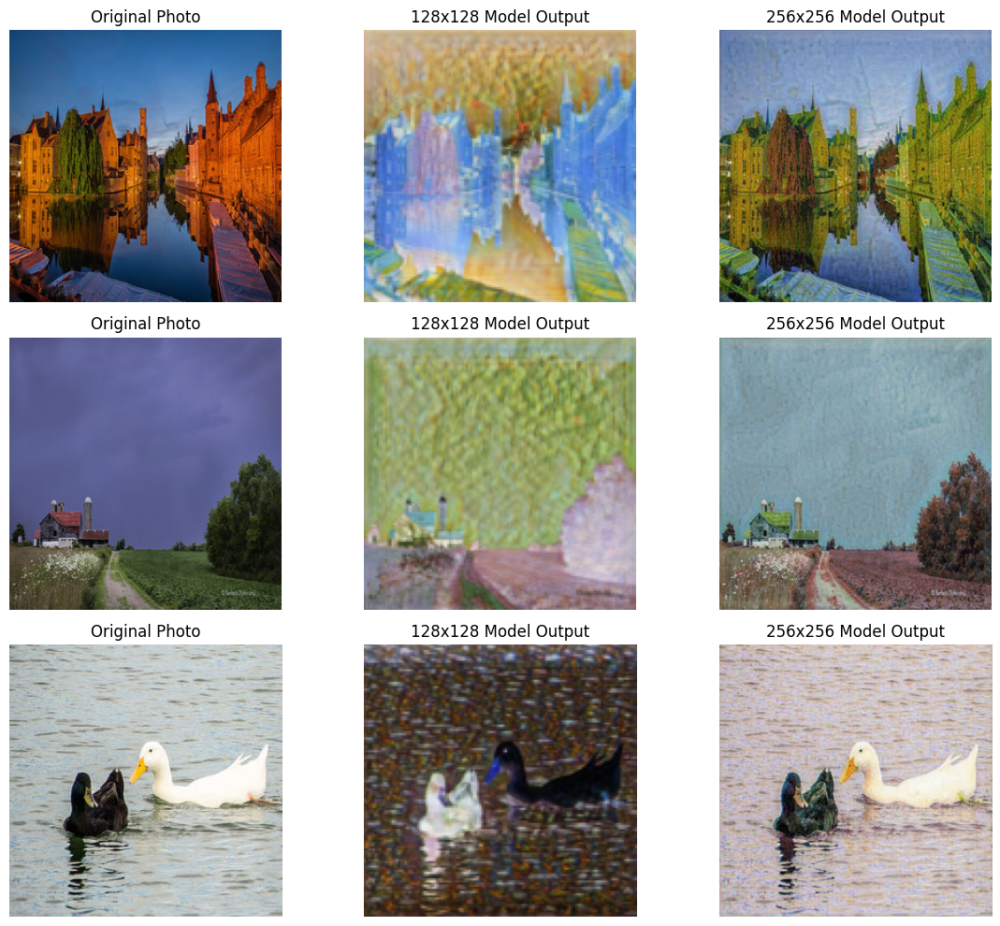

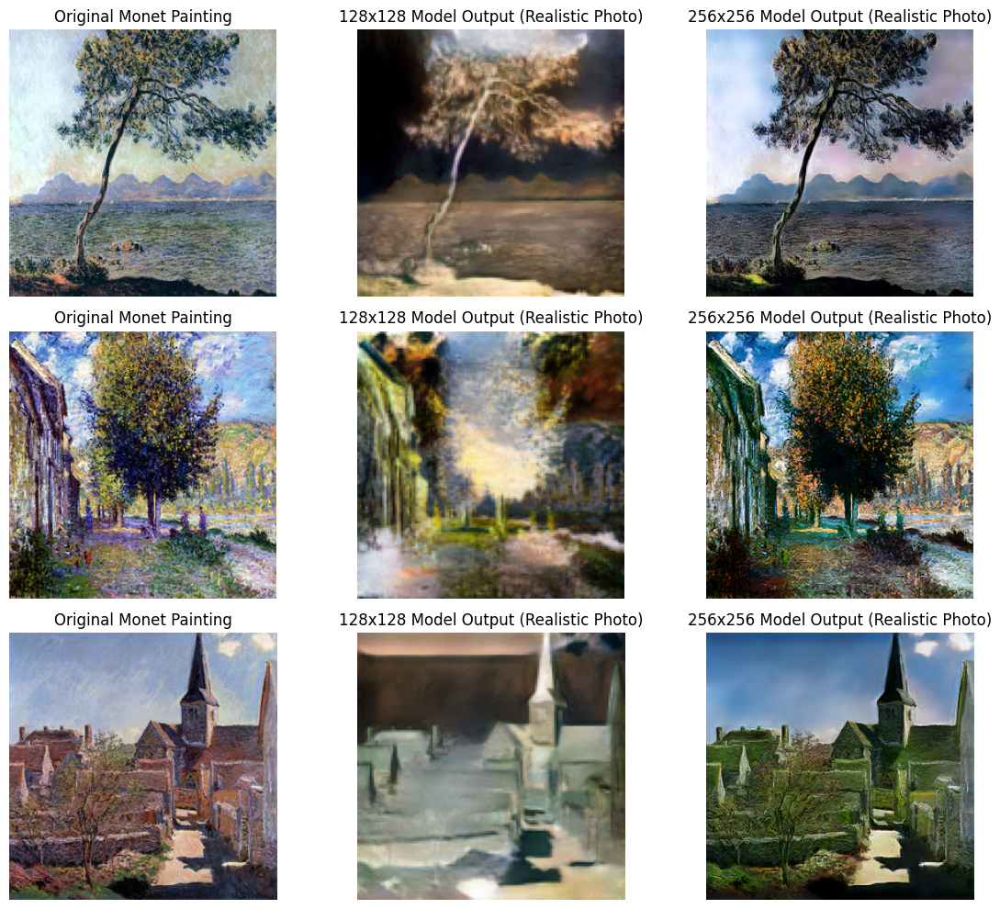

In [8]:
#test model 1 and model 2 with image resolution 128 x 128 and 256x256

# Initialize models
G_BA_128_PM = ResnetGenerator().to(device)
G_BA_256_PM = ResnetGenerator().to(device)
G_AB_128_MP = ResnetGenerator().to(device)  # Monet → Photo
G_AB_256_MP = ResnetGenerator().to(device)  # Monet → Photo

# Load checkpoints
checkpoint_128_PM = "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_128_4/G_BA_final.pth"
checkpoint_256_PM = "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_256_4/G_BA_final.pth"
checkpoint_128_MP = "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_128_4/G_AB_final.pth"
checkpoint_256_MP = "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_256_4/G_AB_final.pth"

G_BA_128_PM.load_state_dict(torch.load(checkpoint_128_PM, map_location=device))
G_BA_256_PM.load_state_dict(torch.load(checkpoint_256_PM, map_location=device))
G_AB_128_MP.load_state_dict(torch.load(checkpoint_128_MP, map_location=device))
G_AB_256_MP.load_state_dict(torch.load(checkpoint_256_MP, map_location=device))

G_BA_128_PM.eval()
G_BA_256_PM.eval()
G_AB_128_MP.eval()
G_AB_256_MP.eval()

# Define transformations (resize to match model training)
transform_128 = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

transform_256 = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

# Load test images
test_images_folder_B = "/content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo/testB"
test_images_B = sorted(os.listdir(test_images_folder_B))[3:6]  # Pick 3 test images for comparison
test_images_folder_A = "/content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo/testA"
test_images_A = sorted(os.listdir(test_images_folder_A))[3:6]  # Pick 3 test images for comparison

def generate_image(model, image_path, transform):
    """Generate Monet-style image using the given model."""
    image = Image.open(image_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension
    with torch.no_grad():
        output_tensor = model(input_tensor)
    output_tensor = output_tensor.squeeze(0).cpu().detach()
    output_image = transforms.ToPILImage()(output_tensor * 0.5 + 0.5)  # De-normalize
    return image, output_image

# Plot comparisons
fig, axes = plt.subplots(len(test_images_B), 3, figsize=(12, 10))

for i, img_name in enumerate(test_images_B):
    img_path = os.path.join(test_images_folder_B, img_name)

    # Generate images using both models
    original, output_128 = generate_image(G_BA_128_PM, img_path, transform_128)
    _, output_256 = generate_image(G_BA_256_PM, img_path, transform_256)

    # Plot results
    axes[i, 0].imshow(original)
    axes[i, 0].set_title("Original Photo")
    axes[i, 1].imshow(output_128)
    axes[i, 1].set_title("128x128 Model Output")
    axes[i, 2].imshow(output_256)
    axes[i, 2].set_title("256x256 Model Output")

    for ax in axes[i]:
        ax.axis("off")

plt.tight_layout()
plt.show()

# Plot comparisons
fig, axes = plt.subplots(len(test_images_A), 3, figsize=(12, 10))

for i, img_name in enumerate(test_images_A):
    img_path = os.path.join(test_images_folder_A, img_name)

    # Generate images using both models
    original, output_128 = generate_image(G_AB_128_MP, img_path, transform_128)
    _, output_256 = generate_image(G_AB_256_MP, img_path, transform_256)

    # Plot results
    axes[i, 0].imshow(original)
    axes[i, 0].set_title("Original Monet Painting")
    axes[i, 1].imshow(output_128)
    axes[i, 1].set_title("128x128 Model Output (Realistic Photo)")
    axes[i, 2].imshow(output_256)
    axes[i, 2].set_title("256x256 Model Output (Realistic Photo)")

    for ax in axes[i]:
        ax.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
# Model 3: Random cropping

checkpoint_path_model3 = "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model3_randomcropping"

transform_model3 = transforms.Compose([
    transforms.RandomCrop(128), # Crop patches of 128x128
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# Create DataLoader with Cropped Images
dataloader_model3 = DataLoader(
    MonetPhotoDataset(root_dir=dataset_path, transform=transform_model3),
    batch_size=8, shuffle=True
)

train(dataloader_model3, checkpoint_path_model3, 50)

Streaming output truncated to the last 5000 lines.
Epoch [44/50], Batch [505/786], Loss_G: 0.5430390238761902, Loss_D_A: 0.5020482540130615, Loss_D_B: 0.4993545711040497
Epoch [44/50], Batch [506/786], Loss_G: 0.5315247178077698, Loss_D_A: 0.4974367916584015, Loss_D_B: 0.5041307210922241
Epoch [44/50], Batch [507/786], Loss_G: 0.5495764017105103, Loss_D_A: 0.4938749670982361, Loss_D_B: 0.48043328523635864
Epoch [44/50], Batch [508/786], Loss_G: 0.5341648459434509, Loss_D_A: 0.4957312345504761, Loss_D_B: 0.4977891147136688
Epoch [44/50], Batch [509/786], Loss_G: 0.5279250741004944, Loss_D_A: 0.5016863942146301, Loss_D_B: 0.5266954898834229
Epoch [44/50], Batch [510/786], Loss_G: 0.5424749851226807, Loss_D_A: 0.49439769983291626, Loss_D_B: 0.5036920309066772
Epoch [44/50], Batch [511/786], Loss_G: 0.5416280627250671, Loss_D_A: 0.4947643578052521, Loss_D_B: 0.4904370605945587
Epoch [44/50], Batch [512/786], Loss_G: 0.5623876452445984, Loss_D_A: 0.4908735752105713, Loss_D_B: 0.484083205461

In [ ]:
# Model 4: Grid-based Cropping

# Define Grid Crop Function
def grid_crop(image, crop_size=128, stride=128):
    """
    Splits a 256x256 image into multiple overlapping 128x128 crops.
    Args:
        image (PIL.Image): Input image (expected 256x256).
        crop_size (int): Size of each crop.
        stride (int): Overlap between crops.
    Returns:
        List of cropped images.
    """
    crops = []
    for i in range(0, image.size[0] - crop_size + 1, stride):
        for j in range(0, image.size[1] - crop_size + 1, stride):
            crop = image.crop((i, j, i + crop_size, j + crop_size))
            crops.append(crop)
    return crops

# Define Dataset Class with Cropping
class MonetPhotoDatasetGridCropping(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.photo_paths = sorted(os.listdir(os.path.join(root_dir, "trainA")))
        self.monet_paths = sorted(os.listdir(os.path.join(root_dir, "trainB")))

    def __len__(self):
        return max(len(self.photo_paths), len(self.monet_paths)) * 4  # Each image gives 4 crops

    def __getitem__(self, idx):
        # Get image paths
        photo_path = os.path.join(self.root_dir, "trainA", self.photo_paths[idx % len(self.photo_paths)])
        monet_path = os.path.join(self.root_dir, "trainB", self.monet_paths[idx % len(self.monet_paths)])

        # Open images
        photo = Image.open(photo_path).convert("RGB")
        monet = Image.open(monet_path).convert("RGB")

        # Generate grid crops
        photo_crops = grid_crop(photo)  # List of 128x128 crops
        monet_crops = grid_crop(monet)

        # Select one crop (cycle through based on index)
        selected_crop = idx % 4  # Picks 0,1,2,3 for different crops
        photo = photo_crops[selected_crop]
        monet = monet_crops[selected_crop]

        # Apply transforms
        if self.transform:
            photo = self.transform(photo)
            monet = self.transform(monet)

        return photo, monet



In [ ]:
# Model 4 training: Grid-based Cropping

checkpoint_path_model4 = "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model4_gridcropping"

transform_model4 = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),  # Normalize [-1,1]
])

dataloader_model4 = DataLoader(MonetPhotoDatasetGridCropping(root_dir=dataset_path, transform=transform_model4), batch_size=16, shuffle=True)

train(dataloader_model4, checkpoint_path_model4, 30) #afterwards trained for 20 more so in total 50 epochs

Streaming output truncated to the last 5000 lines.
Epoch [27/30], Batch [1291/1572], Loss_G: 0.5677087306976318, Loss_D_A: 0.4870878756046295, Loss_D_B: 0.5029459595680237
Epoch [27/30], Batch [1292/1572], Loss_G: 0.5792683362960815, Loss_D_A: 0.49348655343055725, Loss_D_B: 0.4844033122062683
Epoch [27/30], Batch [1293/1572], Loss_G: 0.5779629945755005, Loss_D_A: 0.4825490713119507, Loss_D_B: 0.4899435043334961
Epoch [27/30], Batch [1294/1572], Loss_G: 0.5723210573196411, Loss_D_A: 0.48505401611328125, Loss_D_B: 0.4950326681137085
Epoch [27/30], Batch [1295/1572], Loss_G: 0.5714479684829712, Loss_D_A: 0.4977799355983734, Loss_D_B: 0.5000267028808594
Epoch [27/30], Batch [1296/1572], Loss_G: 0.5898890495300293, Loss_D_A: 0.48899954557418823, Loss_D_B: 0.4871811866760254
Epoch [27/30], Batch [1297/1572], Loss_G: 0.5926456451416016, Loss_D_A: 0.4923461675643921, Loss_D_B: 0.4983672499656677
Epoch [27/30], Batch [1298/1572], Loss_G: 0.5894438624382019, Loss_D_A: 0.5007003545761108, Loss_D_

In [ ]:
# Model 5: Downscaling + Cropping

checkpoint_path_model5 = "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model5_downsampling_randomcropping"

# Define Transformations: Downscaling + Random Cropping
transform_model5 = transforms.Compose([
    transforms.RandomResizedCrop(128, scale=(0.8, 1.0)),  # Randomly resizes & crops in one go
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),  # Normalize [-1,1]
])

dataloader_model5 = DataLoader(MonetPhotoDataset(root_dir=dataset_path, transform=transform_model5), batch_size=8, shuffle=True)

train(dataloader_model5, checkpoint_path_model5, 50)

Streaming output truncated to the last 5000 lines.
Epoch [44/50], Batch [506/786], Loss_G: 0.5635512471199036, Loss_D_A: 0.5162394046783447, Loss_D_B: 0.5082103610038757
Epoch [44/50], Batch [507/786], Loss_G: 0.5657789707183838, Loss_D_A: 0.4984617829322815, Loss_D_B: 0.5020076036453247
Epoch [44/50], Batch [508/786], Loss_G: 0.554983913898468, Loss_D_A: 0.5064194202423096, Loss_D_B: 0.5008836388587952
Epoch [44/50], Batch [509/786], Loss_G: 0.5590391159057617, Loss_D_A: 0.49947887659072876, Loss_D_B: 0.48711878061294556
Epoch [44/50], Batch [510/786], Loss_G: 0.5523250102996826, Loss_D_A: 0.5016984939575195, Loss_D_B: 0.49162137508392334
Epoch [44/50], Batch [511/786], Loss_G: 0.5564039945602417, Loss_D_A: 0.496528685092926, Loss_D_B: 0.487902969121933
Epoch [44/50], Batch [512/786], Loss_G: 0.5255728960037231, Loss_D_A: 0.5038332939147949, Loss_D_B: 0.5311992168426514
Epoch [44/50], Batch [513/786], Loss_G: 0.5521815419197083, Loss_D_A: 0.500432550907135, Loss_D_B: 0.498063504695892

In [ ]:
# Load the trained model from epoch 50
G_AB.load_state_dict(torch.load(f"{checkpoint_path_model5}/G_AB_final.pth", map_location=device))
G_BA.load_state_dict(torch.load(f"{checkpoint_path_model5}/G_BA_final.pth", map_location=device))
print("Loaded Model from Epoch 50")

 # Continue Training Loop (Epoch 50 to 70)

continiue_train(dataloader_model5, checkpoint_path_model5, 20, 50)


Streaming output truncated to the last 5000 lines.
Epoch [64/70], Batch [506/786], Loss_G: 0.6475828886032104, Loss_D_A: 0.3678776025772095, Loss_D_B: 0.4953773021697998
Epoch [64/70], Batch [507/786], Loss_G: 0.6802764534950256, Loss_D_A: 0.37508583068847656, Loss_D_B: 0.4722481369972229
Epoch [64/70], Batch [508/786], Loss_G: 0.6588871479034424, Loss_D_A: 0.3908877372741699, Loss_D_B: 0.5012105703353882
Epoch [64/70], Batch [509/786], Loss_G: 0.7587536573410034, Loss_D_A: 0.36485815048217773, Loss_D_B: 0.5051243305206299
Epoch [64/70], Batch [510/786], Loss_G: 0.7357653379440308, Loss_D_A: 0.39866411685943604, Loss_D_B: 0.4870665669441223
Epoch [64/70], Batch [511/786], Loss_G: 0.7387208938598633, Loss_D_A: 0.32093358039855957, Loss_D_B: 0.4978254735469818
Epoch [64/70], Batch [512/786], Loss_G: 0.6853286027908325, Loss_D_A: 0.37708616256713867, Loss_D_B: 0.4864826798439026
Epoch [64/70], Batch [513/786], Loss_G: 0.7339739203453064, Loss_D_A: 0.3872809410095215, Loss_D_B: 0.499300420

In [ ]:
# Model 6: One Discriminator

# Configuration: Choose which discriminator to remove
remove_D_A = False  # Set to True to remove Discriminator A (real photos)
remove_D_B = True   # Set to True to remove Discriminator B (Monet paintings)


# Define Transformations (Keep 256x256)
transform_model6 = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

# Initialize DataLoader
dataloader_model6 = DataLoader(MonetPhotoDataset(root_dir=dataset_path, transform=transform_model6), batch_size=8, shuffle=True)

print(f"DataLoader Ready: {len(dataloader_model6)} batches per epoch")

# Define Generator
class ResnetGeneratorOneDiscriminator(nn.Module):
    def __init__(self, input_channels=3, output_channels=3, num_residual_blocks=6):
        super(ResnetGeneratorOneDiscriminator, self).__init__()
        model = [
            nn.Conv2d(input_channels, 64, kernel_size=7, padding=3),
            nn.ReLU(inplace=True)
        ]
        for _ in range(num_residual_blocks):
            model += [nn.Conv2d(64, 64, kernel_size=3, padding=1), nn.ReLU(inplace=True)]
        model += [
            nn.Conv2d(64, output_channels, kernel_size=7, padding=3),
            nn.Tanh()
        ]
        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)


# Initialize Models
G_AB = ResnetGeneratorOneDiscriminator().to("cuda")  # Monet → Photo
G_BA = ResnetGeneratorOneDiscriminator().to("cuda")  # Photo → Monet

if not remove_D_A:
    D_A = Discriminator().to("cuda")
if not remove_D_B:
    D_B = Discriminator().to("cuda")

# Define Loss Functions
cycle_loss = nn.L1Loss()
adversarial_loss = nn.MSELoss()

# Define Optimizers
optimizer_G = optim.Adam(list(G_AB.parameters()) + list(G_BA.parameters()), lr=0.0002, betas=(0.5, 0.999))
if not remove_D_A:
    optimizer_D_A = optim.Adam(D_A.parameters(), lr=0.0002, betas=(0.5, 0.999))
if not remove_D_B:
    optimizer_D_B = optim.Adam(D_B.parameters(), lr=0.0002, betas=(0.5, 0.999))

✅ DataLoader Ready: 786 batches per epoch


In [ ]:
# Model 6: Training Loop

num_epochs = 50
checkpoint_path_model6 = "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model6_one_discriminator"

for epoch in range(num_epochs):
    for batch_idx, (real_A, real_B) in enumerate(dataloader_model6):
        real_A, real_B = real_A.to("cuda"), real_B.to("cuda")

        # Train Generators
        optimizer_G.zero_grad()
        fake_B = G_AB(real_A)
        fake_A = G_BA(real_B)
        cycle_A = G_BA(fake_B)
        cycle_B = G_AB(fake_A)

        loss_G = cycle_loss(real_A, cycle_A) + cycle_loss(real_B, cycle_B)

        if not remove_D_A:
            loss_G += adversarial_loss(D_A(fake_A), torch.ones_like(D_A(fake_A)))
        if not remove_D_B:
            loss_G += adversarial_loss(D_B(fake_B), torch.ones_like(D_B(fake_B)))

        loss_G.backward(retain_graph=True)
        optimizer_G.step()

        # Train Discriminators
        if not remove_D_A:
            optimizer_D_A.zero_grad()
            loss_D_A = adversarial_loss(D_A(real_A), torch.ones_like(D_A(real_A))) + \
                       adversarial_loss(D_A(fake_A.detach()), torch.zeros_like(D_A(fake_A)))
            loss_D_A.backward()
            optimizer_D_A.step()
        else:
            loss_D_A = torch.tensor(0)

        if not remove_D_B:
            optimizer_D_B.zero_grad()
            loss_D_B = adversarial_loss(D_B(real_B), torch.ones_like(D_B(real_B))) + \
                       adversarial_loss(D_B(fake_B.detach()), torch.zeros_like(D_B(fake_B)))
            loss_D_B.backward()
            optimizer_D_B.step()
        else:
            loss_D_B = torch.tensor(0)

        print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(dataloader_model6)}], Loss_G: {loss_G.item()}, Loss_D_A: {loss_D_A.item()}, Loss_D_B: {loss_D_B.item()}")

    # Save Checkpoints every 5 epochs
    if (epoch + 1) % 5 == 0:
        torch.save(G_AB.state_dict(), f"{checkpoint_path_model6}/G_AB_epoch{epoch+1}_one_discriminator.pth")
        torch.save(G_BA.state_dict(), f"{checkpoint_path_model6}/G_BA_epoch{epoch+1}_one_discriminator.pth")
        print(f"Saved checkpoint at epoch {epoch+1}")


# Save Final Model
torch.save(G_AB.state_dict(), f"{checkpoint_path_model6}/G_AB_final.pth")
torch.save(G_BA.state_dict(), f"{checkpoint_path_model6}/G_BA_final.pth")

print("Training Completed!")
print("Final Model Saved!")


Streaming output truncated to the last 5000 lines.
Epoch [44/50], Batch [507/786], Loss_G: 0.49930962920188904, Loss_D_A: 0.43334120512008667, Loss_D_B: 0
Epoch [44/50], Batch [508/786], Loss_G: 0.48602545261383057, Loss_D_A: 0.49438345432281494, Loss_D_B: 0
Epoch [44/50], Batch [509/786], Loss_G: 0.4113474488258362, Loss_D_A: 0.4670465290546417, Loss_D_B: 0
Epoch [44/50], Batch [510/786], Loss_G: 0.4858074486255646, Loss_D_A: 0.48188579082489014, Loss_D_B: 0
Epoch [44/50], Batch [511/786], Loss_G: 0.4132649898529053, Loss_D_A: 0.4182058572769165, Loss_D_B: 0
Epoch [44/50], Batch [512/786], Loss_G: 0.45220768451690674, Loss_D_A: 0.398972749710083, Loss_D_B: 0
Epoch [44/50], Batch [513/786], Loss_G: 0.40060368180274963, Loss_D_A: 0.3999292254447937, Loss_D_B: 0
Epoch [44/50], Batch [514/786], Loss_G: 0.4222784638404846, Loss_D_A: 0.4422628879547119, Loss_D_B: 0
Epoch [44/50], Batch [515/786], Loss_G: 0.35600271821022034, Loss_D_A: 0.4280838370323181, Loss_D_B: 0
Epoch [44/50], Batch [51

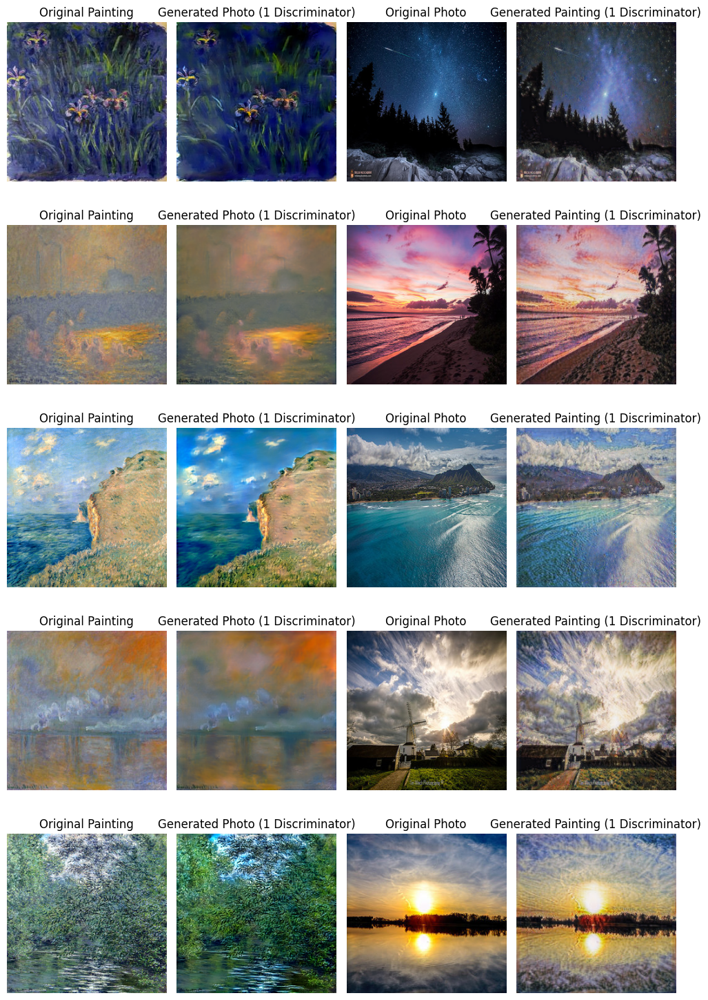

In [ ]:
# Load Model 6
checkpoint_path_model6 = "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model6_one_discriminator"
G_AB = ResnetGeneratorOneDiscriminator().to(device)  # Photo → Monet
G_BA = ResnetGeneratorOneDiscriminator().to(device)  # Monet → Photo

G_AB.load_state_dict(torch.load(f"{checkpoint_path_model6}/G_AB_final.pth", map_location=device))
G_BA.load_state_dict(torch.load(f"{checkpoint_path_model6}/G_BA_final.pth", map_location=device))
G_AB.eval()
G_BA.eval()

# Load Test Images
test_photo_path = "/content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo/testA"  # Real photos
test_monet_path = "/content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo/testB"  # Monet paintings

test_photos = random.sample(os.listdir(test_photo_path), 5)  # Pick 5 random photos
test_monets = random.sample(os.listdir(test_monet_path), 5)  # Pick 5 random Monet paintings

# Generate and Display Results
fig, axs = plt.subplots(len(test_photos), 4, figsize=(10, 15))

for i in range(len(test_photos)):
    # Load and preprocess images
    photo_img = Image.open(os.path.join(test_photo_path, test_photos[i])).convert("RGB")
    monet_img = Image.open(os.path.join(test_monet_path, test_monets[i])).convert("RGB")

    photo_tensor = transform_model6(photo_img).unsqueeze(0).to(device)
    monet_tensor = transform_model6(monet_img).unsqueeze(0).to(device)

    # Generate Monet-style and Photo-style images
    with torch.no_grad():
        fake_monet = G_AB(photo_tensor).squeeze(0).cpu()
        fake_photo = G_BA(monet_tensor).squeeze(0).cpu()

    fake_monet = transforms.ToPILImage()(fake_monet * 0.5 + 0.5)  # Denormalize
    fake_photo = transforms.ToPILImage()(fake_photo * 0.5 + 0.5)  # Denormalize

    # Display
    axs[i, 0].imshow(photo_img)
    axs[i, 0].set_title("Original Painting")
    axs[i, 0].axis("off")

    axs[i, 1].imshow(fake_monet)
    axs[i, 1].set_title("Generated Photo (1 Discriminator)")
    axs[i, 1].axis("off")

    axs[i, 2].imshow(monet_img)
    axs[i, 2].set_title("Original Photo")
    axs[i, 2].axis("off")

    axs[i, 3].imshow(fake_photo)
    axs[i, 3].set_title("Generated Painting (1 Discriminator)")
    axs[i, 3].axis("off")

plt.tight_layout()
plt.show()


In [12]:
# Define Image Transformations
transform_model1 = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),  # Normalize [-1,1]
])

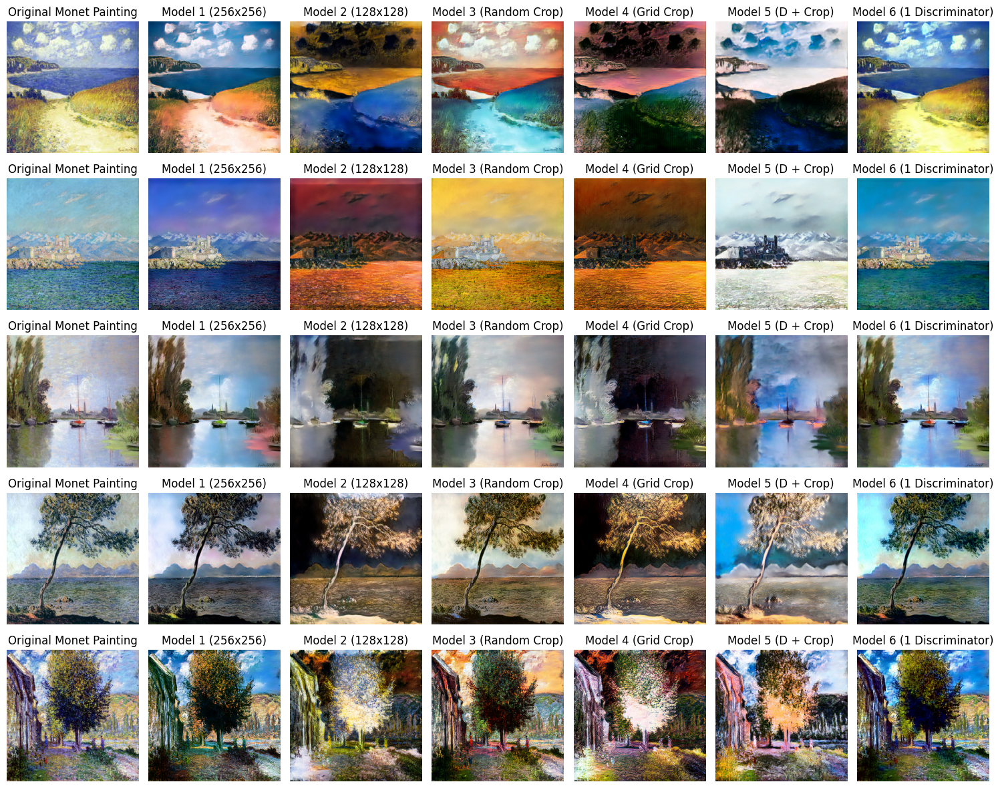

In [13]:

# Define Model Paths
model_checkpoints_monet_to_photo = {
    "Model 1 (256x256)": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_256_4/G_AB_final.pth",
    "Model 2 (128x128)": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_128_4/G_AB_final.pth",
    "Model 3 (Random Crop)": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model3_randomcropping/G_AB_final.pth",
    "Model 4 (Grid Crop)": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model4_gridcropping/G_AB_final.pth",
    "Model 5 (D + Crop)": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model5_downsampling_randomcropping/G_AB_final.pth",
    "Model 6 (1 Discriminator)": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model6_one_discriminator/G_AB_final.pth",
}

# Function to Load a Model
def load_model(checkpoint_path):
    model = ResnetGenerator().to("cpu")
    model.load_state_dict(torch.load(checkpoint_path, map_location="cpu"))
    model.eval()  # Set to evaluation mode
    return model

def load_model_model6(checkpoint_path):
    model = ResnetGeneratorOneDiscriminator().to("cpu")  # Match the exact model used in Model 6
    model.load_state_dict(torch.load(checkpoint_path, map_location="cpu"))
    model.eval()
    return model


# Select Test Images (Monet Painitngs)
test_images_path = "/content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo/testA"
test_images = sorted(os.listdir(test_images_path))[:5]  # Load a few images

# Load All Models
models = {}
for name, path in model_checkpoints_monet_to_photo.items():
    if "1 Discriminator" in name:
        models[name] = load_model_model6(path)
    else:
        models[name] = load_model(path)


# Generate Outputs for Each Model
fig, axes = plt.subplots(len(test_images), len(models) + 1, figsize=(15, 12))
for row, img_name in enumerate(test_images):
    img_path = os.path.join(test_images_path, img_name)
    original_img = Image.open(img_path).convert("RGB")
    input_tensor = transform_model1(original_img).unsqueeze(0)  # Add batch dimension

    # First Column: Original Monet Painting
    axes[row, 0].imshow(original_img)
    axes[row, 0].set_title("Original Monet Painting")
    axes[row, 0].axis("off")

    # Generate and Display for Each Model
    for col, (model_name, model) in enumerate(models.items()):
        with torch.no_grad():
            generated = model(input_tensor).squeeze(0).cpu()
            generated = (generated * 0.5) + 0.5  # Denormalize to [0,1]
            generated = transforms.ToPILImage()(generated)

        axes[row, col + 1].imshow(generated)
        axes[row, col + 1].set_title(model_name)
        axes[row, col + 1].axis("off")

plt.tight_layout()
plt.show()


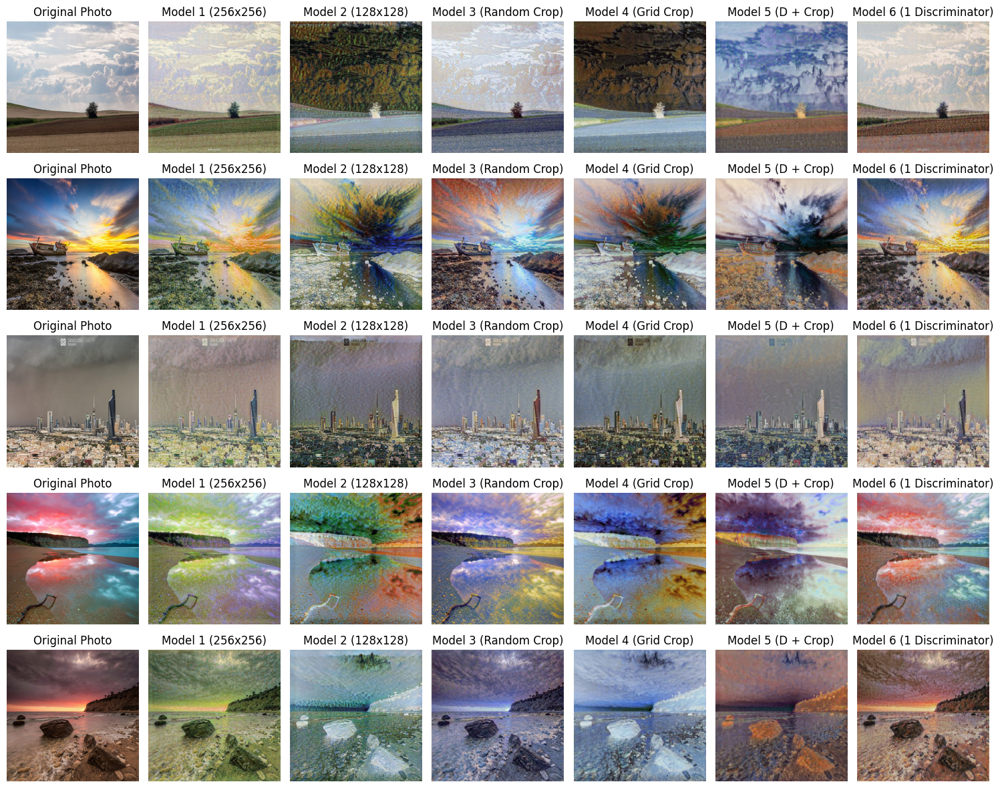

In [15]:
# Define Model Paths
model_checkpoints_photo_to_monet = {
    "Model 1 (256x256)": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_256_4/G_BA_final.pth",
    "Model 2 (128x128)": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_128_4/G_BA_final.pth",
    "Model 3 (Random Crop)": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model3_randomcropping/G_BA_final.pth",
    "Model 4 (Grid Crop)": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model4_gridcropping/G_BA_final.pth",
    "Model 5 (D + Crop)": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model5_downsampling_randomcropping/G_BA_final.pth",
    "Model 6 (1 Discriminator)": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model6_one_discriminator/G_BA_final.pth",
}

# Load All Models
models = {}
for name, path in model_checkpoints_photo_to_monet.items():
    if "1 Discriminator" in name:
        models[name] = load_model_model6(path)
    else:
        models[name] = load_model(path)

# Select Test Images (Photos)
test_images_path = "/content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo/testB"
test_images = sorted(os.listdir(test_images_path))[10:15]  # Load a few images


# Generate Outputs for Each Model
fig, axes = plt.subplots(len(test_images), len(models) + 1, figsize=(15, 12))
for row, img_name in enumerate(test_images):
    img_path = os.path.join(test_images_path, img_name)
    original_img = Image.open(img_path).convert("RGB")
    input_tensor = transform_model1(original_img).unsqueeze(0)  # Add batch dimension

    # First Column: Original Image
    axes[row, 0].imshow(original_img)
    axes[row, 0].set_title("Original Photo")
    axes[row, 0].axis("off")

    # Generate and Display for Each Model
    for col, (model_name, model) in enumerate(models.items()):
        with torch.no_grad():
            generated = model(input_tensor).squeeze(0).cpu()
            generated = (generated * 0.5) + 0.5  # Denormalize to [0,1]
            generated = transforms.ToPILImage()(generated)

        axes[row, col + 1].imshow(generated)
        axes[row, col + 1].set_title(model_name)
        axes[row, col + 1].axis("off")

plt.tight_layout()
plt.show()


In [16]:
pip install torch torchvision numpy scipy pillow opencv-python tensorflow clean-fid scikit-image


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 111.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 85.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 47.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 38.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 17.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 99.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitl

Generating images with model: /content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_256_4/G_AB_final.pth
Generating images with model: /content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_256_4/G_BA_final.pth
Generating images with model: /content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_128_4/G_AB_final.pth
Generating images with model: /content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_128_4/G_BA_final.pth
Generating images with model: /content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model3_randomcropping/G_AB_final.pth
Generating images with model: /content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model3_randomcropping/G_BA_final.pth
Generating images with model: /content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model4_gridcropping/G_AB_final.pth
Generating images with model: /content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model4_gridcropping/G_B

FID Model_1_(256x256)_Photo_to_Monet : 100%|██████████| 7/7 [00:05<00:00,  1.33it/s]


Found 6287 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo/trainB


FID trainB : 100%|██████████| 197/197 [01:16<00:00,  2.59it/s]


compute FID between two folders
Found 200 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/generated_images/Model_1_(256x256)_Monet_to_Photo


FID Model_1_(256x256)_Monet_to_Photo : 100%|██████████| 7/7 [00:04<00:00,  1.42it/s]


Found 1072 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo/trainA


FID trainA : 100%|██████████| 34/34 [00:12<00:00,  2.67it/s]


Processing Model 2 (128x128)...
compute FID between two folders
Found 200 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/generated_images/Model_2_(128x128)_Photo_to_Monet


FID Model_2_(128x128)_Photo_to_Monet : 100%|██████████| 7/7 [00:04<00:00,  1.44it/s]


Found 6287 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo/trainB


FID trainB : 100%|██████████| 197/197 [00:16<00:00, 11.90it/s]


compute FID between two folders
Found 200 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/generated_images/Model_2_(128x128)_Monet_to_Photo


FID Model_2_(128x128)_Monet_to_Photo : 100%|██████████| 7/7 [00:05<00:00,  1.40it/s]


Found 1072 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo/trainA


FID trainA : 100%|██████████| 34/34 [00:06<00:00,  5.36it/s]


Processing Model 3 (Random Crop)...
compute FID between two folders
Found 200 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/generated_images/Model_3_(Random_Crop)_Photo_to_Monet


FID Model_3_(Random_Crop)_Photo_to_Monet : 100%|██████████| 7/7 [00:04<00:00,  1.41it/s]


Found 6287 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo/trainB


FID trainB : 100%|██████████| 197/197 [01:16<00:00,  2.57it/s]


compute FID between two folders
Found 200 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/generated_images/Model_3_(Random_Crop)_Monet_to_Photo


FID Model_3_(Random_Crop)_Monet_to_Photo : 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]


Found 1072 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo/trainA


FID trainA : 100%|██████████| 34/34 [00:11<00:00,  3.08it/s]


Processing Model 4 (Grid Crop)...
compute FID between two folders
Found 200 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/generated_images/Model_4_(Grid_Crop)_Photo_to_Monet


FID Model_4_(Grid_Crop)_Photo_to_Monet : 100%|██████████| 7/7 [00:04<00:00,  1.41it/s]


Found 6287 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo/trainB


FID trainB : 100%|██████████| 197/197 [00:16<00:00, 11.85it/s]


compute FID between two folders
Found 200 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/generated_images/Model_4_(Grid_Crop)_Monet_to_Photo


FID Model_4_(Grid_Crop)_Monet_to_Photo : 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]


Found 1072 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo/trainA


FID trainA : 100%|██████████| 34/34 [00:06<00:00,  5.26it/s]


Processing Model 5 (Downsampling + Random Crop)...
compute FID between two folders
Found 200 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/generated_images/Model_5_(Downsampling_+_Random_Crop)_Photo_to_Monet


FID Model_5_(Downsampling_+_Random_Crop)_Photo_to_Monet : 100%|██████████| 7/7 [00:04<00:00,  1.42it/s]


Found 6287 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo/trainB


FID trainB : 100%|██████████| 197/197 [01:17<00:00,  2.54it/s]


compute FID between two folders
Found 200 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/generated_images/Model_5_(Downsampling_+_Random_Crop)_Monet_to_Photo


FID Model_5_(Downsampling_+_Random_Crop)_Monet_to_Photo : 100%|██████████| 7/7 [00:05<00:00,  1.38it/s]


Found 1072 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo/trainA


FID trainA : 100%|██████████| 34/34 [00:12<00:00,  2.75it/s]


Processing Model 6 (1 Discriminator)...
compute FID between two folders
Found 200 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/generated_images/Model_6_(1_Discriminator)_Photo_to_Monet


FID Model_6_(1_Discriminator)_Photo_to_Monet : 100%|██████████| 7/7 [00:04<00:00,  1.40it/s]


Found 6287 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo/trainB


FID trainB : 100%|██████████| 197/197 [01:16<00:00,  2.58it/s]


compute FID between two folders
Found 200 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/generated_images/Model_6_(1_Discriminator)_Monet_to_Photo


FID Model_6_(1_Discriminator)_Monet_to_Photo : 100%|██████████| 7/7 [00:05<00:00,  1.39it/s]


Found 1072 images in the folder /content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo/trainA


FID trainA : 100%|██████████| 34/34 [00:06<00:00,  5.27it/s]



=== FID Scores (Lower is Better) ===
Model 1 (256x256): Photo → Monet: 162.42, Monet → Photo: 132.54
Model 2 (128x128): Photo → Monet: 189.68, Monet → Photo: 162.57
Model 3 (Random Crop): Photo → Monet: 149.43, Monet → Photo: 132.01
Model 4 (Grid Crop): Photo → Monet: 187.17, Monet → Photo: 151.41
Model 5 (Downsampling + Random Crop): Photo → Monet: 181.07, Monet → Photo: 139.02
Model 6 (1 Discriminator): Photo → Monet: 171.82, Monet → Photo: 135.32

=== SSIM Scores (Higher is Better) ===
Model 1 (256x256): Photo → Monet: 0.1747, Monet → Photo: 0.1549
Model 2 (128x128): Photo → Monet: 0.1555, Monet → Photo: 0.1213
Model 3 (Random Crop): Photo → Monet: 0.1797, Monet → Photo: 0.1405
Model 4 (Grid Crop): Photo → Monet: 0.1348, Monet → Photo: 0.1410
Model 5 (Downsampling + Random Crop): Photo → Monet: 0.1705, Monet → Photo: 0.1712
Model 6 (1 Discriminator): Photo → Monet: 0.1803, Monet → Photo: 0.1589


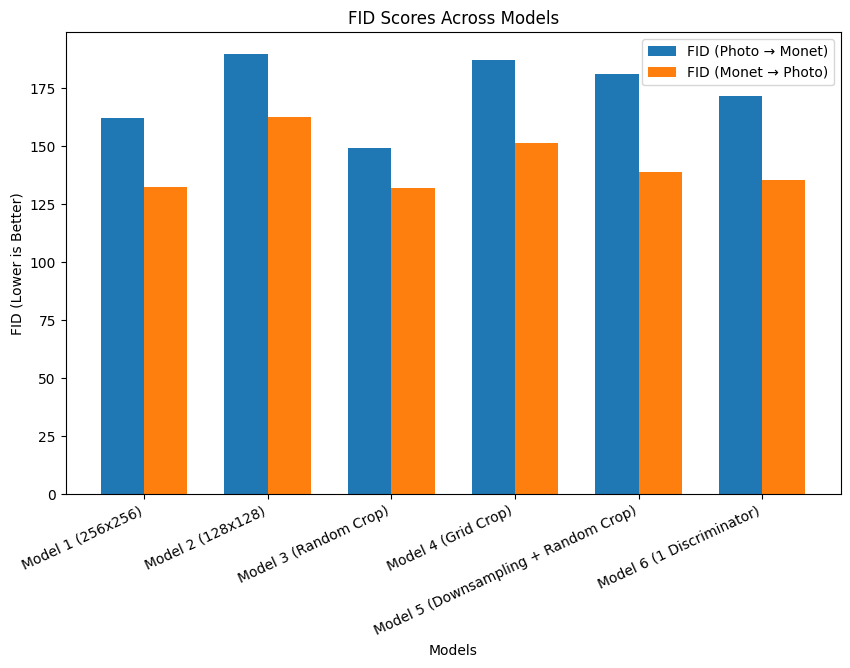

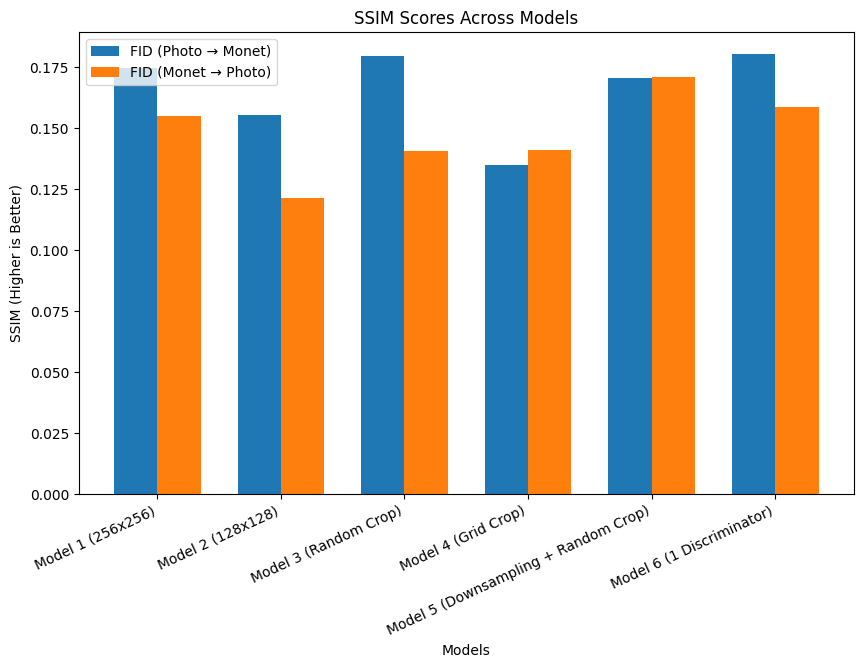

In [17]:
import os
import numpy as np
import torch
import torchvision.transforms as transforms
import torchvision.models as models
import cv2
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
from cleanfid import fid
from PIL import Image

# Paths to real images
real_monet_dir = "/content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo/trainB"
real_photo_dir = "/content/drive/MyDrive/CV_Final_Yanik_Gecim/datasets/monet2photo/trainA"

# Paths to trained models
model_checkpoints = {
    "Model 1 (256x256)": {
        "G_AB": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_256_4/G_AB_final.pth",
        "G_BA": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_256_4/G_BA_final.pth",
    },
    "Model 2 (128x128)": {
        "G_AB": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_128_4/G_AB_final.pth",
        "G_BA": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_128_4/G_BA_final.pth",
    },
    "Model 3 (Random Crop)": {
        "G_AB": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model3_randomcropping/G_AB_final.pth",
        "G_BA": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model3_randomcropping/G_BA_final.pth",
    },
    "Model 4 (Grid Crop)": {
        "G_AB": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model4_gridcropping/G_AB_final.pth",
        "G_BA": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model4_gridcropping/G_BA_final.pth",
    },
    "Model 5 (Downsampling + Random Crop)": {
        "G_AB": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model5_downsampling_randomcropping/G_AB_final.pth",
        "G_BA": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model5_downsampling_randomcropping/G_BA_final.pth",
    },
    "Model 6 (1 Discriminator)": {
        "G_AB": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model6_one_discriminator/G_AB_final.pth",
        "G_BA": "/content/drive/MyDrive/CV_Final_Yanik_Gecim/checkpoints/checkpoints_model6_one_discriminator/G_BA_final.pth",
    }

}

# Output directories for generated images
output_dirs = {
    name: {
        "Photo_to_Monet": f"/content/drive/MyDrive/CV_Final_Yanik_Gecim/generated_images/{name.replace(' ', '_')}_Photo_to_Monet",
        "Monet_to_Photo": f"/content/drive/MyDrive/CV_Final_Yanik_Gecim/generated_images/{name.replace(' ', '_')}_Monet_to_Photo"
    }
    for name in model_checkpoints.keys()
}

# Create necessary directories
for paths in output_dirs.values():
    os.makedirs(paths["Photo_to_Monet"], exist_ok=True)
    os.makedirs(paths["Monet_to_Photo"], exist_ok=True)


# Function to generate images
def generate_images(model_path, input_dir, output_dir, use_model6=False):
    print(f"Generating images with model: {model_path}")

    # Load model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    if use_model6:
        model = ResnetGeneratorOneDiscriminator().to(device)
    else:
        model = ResnetGenerator().to(device)

    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()

    image_paths = sorted(os.listdir(input_dir))[:200]  # Use 200 images
    for img_name in image_paths:
        img_path = os.path.join(input_dir, img_name)
        image = Image.open(img_path).convert("RGB")
        image = transform_model1(image).unsqueeze(0).to(device)

        with torch.no_grad():
            generated = model(image)
            generated = (generated.squeeze().cpu().numpy().transpose(1, 2, 0) + 1) / 2  # Denormalize

        # Save generated image
        save_path = os.path.join(output_dir, img_name)
        cv2.imwrite(save_path, (generated * 255).astype(np.uint8))


# Generate images for each model
for model_name, paths in model_checkpoints.items():
    is_model6 = "1 Discriminator" in model_name
    generate_images(paths["G_AB"], real_photo_dir, output_dirs[model_name]["Photo_to_Monet"], use_model6=is_model6)
    generate_images(paths["G_BA"], real_monet_dir, output_dirs[model_name]["Monet_to_Photo"], use_model6=is_model6)


# Function to compute SSIM
def compute_ssim(real_dir, gen_dir):
    real_images = sorted(os.listdir(real_dir))[:200]
    gen_images = sorted(os.listdir(gen_dir))[:200]

    ssim_scores = []
    for r_img, g_img in zip(real_images, gen_images):
        real = cv2.imread(os.path.join(real_dir, r_img))
        gen = cv2.imread(os.path.join(gen_dir, g_img))

        real_gray = cv2.cvtColor(real, cv2.COLOR_BGR2GRAY)
        gen_gray = cv2.cvtColor(gen, cv2.COLOR_BGR2GRAY)

        score, _ = ssim(real_gray, gen_gray, full=True)
        ssim_scores.append(score)

    return np.mean(ssim_scores)


# Compute FID & SSIM for each model
fid_scores = {}
ssim_scores = {}

for model_name, dirs in output_dirs.items():
    print(f"Processing {model_name}...")

    fid_photo_monet = fid.compute_fid(dirs["Photo_to_Monet"], real_monet_dir)
    fid_monet_photo = fid.compute_fid(dirs["Monet_to_Photo"], real_photo_dir)

    fid_scores[model_name] = (fid_photo_monet, fid_monet_photo)

    ssim_photo_monet = compute_ssim(real_monet_dir, dirs["Photo_to_Monet"])
    ssim_monet_photo = compute_ssim(real_photo_dir, dirs["Monet_to_Photo"])

    ssim_scores[model_name] = (ssim_photo_monet, ssim_monet_photo)

# Print numerical values for FID and SSIM scores for better interpretation
print("\n=== FID Scores (Lower is Better) ===")
for model, (fid_photo_monet, fid_monet_photo) in fid_scores.items():
    print(f"{model}: Photo → Monet: {fid_photo_monet:.2f}, Monet → Photo: {fid_monet_photo:.2f}")

print("\n=== SSIM Scores (Higher is Better) ===")
for model, (ssim_photo_monet, ssim_monet_photo) in ssim_scores.items():
    print(f"{model}: Photo → Monet: {ssim_photo_monet:.4f}, Monet → Photo: {ssim_monet_photo:.4f}")


# Plot FID & SSIM results
def plot_metric(metric_dict, title, ylabel):
    models = list(metric_dict.keys())
    monet_values = [metric_dict[m][0] for m in models]
    photo_values = [metric_dict[m][1] for m in models]

    x = np.arange(len(models))
    width = 0.35

    fig, ax = plt.subplots(figsize=(10, 6))
    ax.bar(x - width/2, monet_values, width, label="FID (Photo → Monet)")
    ax.bar(x + width/2, photo_values, width, label="FID (Monet → Photo)")

    ax.set_xlabel("Models")
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.set_xticks(x)
    ax.set_xticklabels(models, rotation=25, ha="right")
    ax.legend()
    plt.show()


plot_metric(fid_scores, "FID Scores Across Models", "FID (Lower is Better)")
plot_metric(ssim_scores, "SSIM Scores Across Models", "SSIM (Higher is Better)")
